# TASK #1: UNDERSTAND THE PROBLEM STATEMENT AND BUSINESS CASE

In [10]:
pip install nbconvert[webpdf]


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: nbconvert[webpdf] in c:\users\tej bachhav\appdata\local\programs\python\python312\lib\site-packages (7.16.4)




[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Google and Aravind Eye Hospital work: https://venturebeat.com/2019/02/25/google-works-with-aravind-eye-hospital-to-deploy-ai-that-can-detect-eye-disease/

Data Source: https://www.kaggle.com/c/diabetic-retinopathy-detection

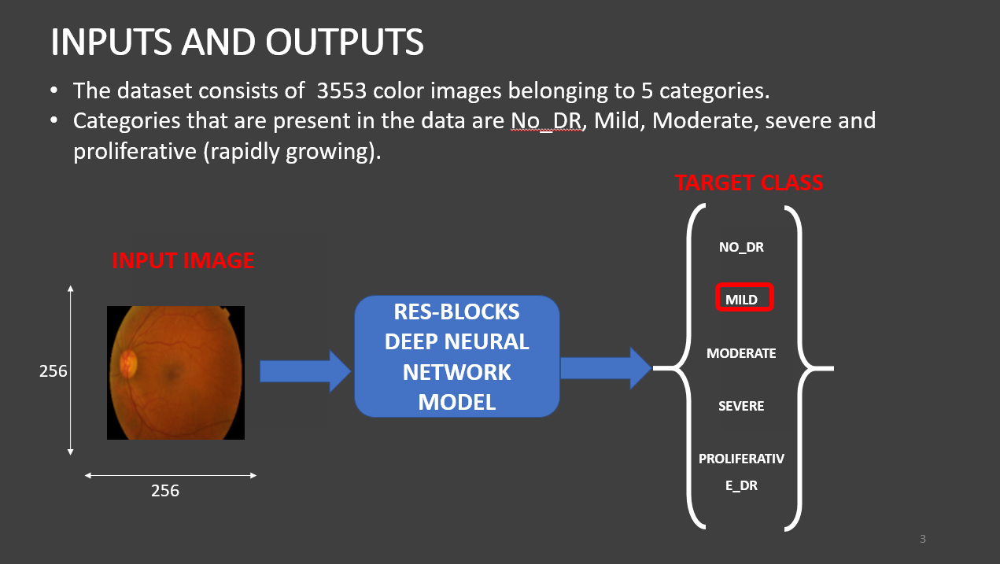

# TASK #2: IMPORT LIBRARIES/DATASETS

In [11]:
pip install jupyterthemes


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False)

# setting the style of the notebook to be monokai theme  
# this line of code is important to ensure that we are able to see the x and y axes clearly
# If you don't run this code line, you will notice that the xlabel and ylabel on any plot is black on black and it will be hard to see them. 

In [13]:
# Import the necessary packages

import pandas as pd
print(pd.__version__)
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler



2.2.2


In [14]:

# Check if the file exists
if os.path.isfile(r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\train.csv'):
    print("File exists")
else:
    print("File does not exist")


File exists


In [15]:
with open(r"C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\train.csv", 'r') as file:
    for line in file:
        print(line.strip())  # Printing each line in the file



id_code,diagnosis
000c1434d8d7,2
001639a390f0,4
0024cdab0c1e,1
002c21358ce6,0
005b95c28852,0
0083ee8054ee,4
0097f532ac9f,0
00a8624548a9,2
00b74780d31d,2
00cb6555d108,1
00cc2b75cddd,0
00e4ddff966a,2
00f6c1be5a33,0
0104b032c141,3
0124dffecf29,1
0125fbd2e791,0
012a242ac6ff,2
014508ccb9cb,0
0151781fe50b,0
0161338f53cc,2
0180bfa26c0b,2
0182152c50de,0
01b3aed3ed4c,1
01c7808d901d,2
01d9477b1171,0
01eb826f6467,2
01f7bb8be950,0
0212dd31f623,0
022f820027b8,0
0231642cf1c2,0
0232dfea7547,0
02358b47ea89,0
0243404e8a00,4
025a169a0bb0,2
02685f13cefd,4
026dcd9af143,2
02cd34a85b24,0
02da652c74b8,0
02dda30d3acf,4
0304bedad8fe,0
0318598cfd16,4
032d7b0b4bf6,2
033f2b43de6d,2
034cb07a550f,4
03676c71ed1b,2
0369f3efe69b,1
03747397839f,2
03a7f4a5786f,4
03b373718013,0
03c85870824c,3
03e25101e8e8,1
03fd50da928d,2
03ff7d159f10,2
0415fc68b176,2
041f09eec1e8,2
0423237770a7,0
042470a92154,3
04579e31e4be,0
04a6fc58dabc,2
04ac765f91a1,1
04aef84a2cc1,0
04d029cfb612,2
04efb1a284cc,0
050bb1eafa76,0
05113073b268,0
05195a3

In [21]:
# Define the folder paths
folders = { 
    'Mild': r'D:\DL PROJECT VSCODE\datasets\Mild',
    'Moderate': r'D:\DL PROJECT VSCODE\datasets\Moderate',
    'No_DR': r'D:\DL PROJECT VSCODE\datasets\No_DR',
    'Proliferate_DR': r'D:\DL PROJECT VSCODE\datasets\Proliferate_DR',
    'Severe': r'D:\DL PROJECT VSCODE\datasets\Severe'
}

# Open and read the file
with open(r"C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\train.csv", 'r') as file:
    for line in file:
        print(line.strip())  # Printing each line in the file

# Iterate over each folder and process the images
for folder_name, folder_path in folders.items():
    print(f"Processing folder: {folder_name}")
    
    # Check if the folder exists
    if os.path.exists(folder_path):
        # Iterate over all files in the folder
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)
            
            # Check if it's a file (and not a directory) and if it's an image
            if os.path.isfile(file_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                print(f"Found image file: {filename} in {folder_name}")
    else:
        print(f"Folder {folder_name} does not exist.")

id_code,diagnosis
000c1434d8d7,2
001639a390f0,4
0024cdab0c1e,1
002c21358ce6,0
005b95c28852,0
0083ee8054ee,4
0097f532ac9f,0
00a8624548a9,2
00b74780d31d,2
00cb6555d108,1
00cc2b75cddd,0
00e4ddff966a,2
00f6c1be5a33,0
0104b032c141,3
0124dffecf29,1
0125fbd2e791,0
012a242ac6ff,2
014508ccb9cb,0
0151781fe50b,0
0161338f53cc,2
0180bfa26c0b,2
0182152c50de,0
01b3aed3ed4c,1
01c7808d901d,2
01d9477b1171,0
01eb826f6467,2
01f7bb8be950,0
0212dd31f623,0
022f820027b8,0
0231642cf1c2,0
0232dfea7547,0
02358b47ea89,0
0243404e8a00,4
025a169a0bb0,2
02685f13cefd,4
026dcd9af143,2
02cd34a85b24,0
02da652c74b8,0
02dda30d3acf,4
0304bedad8fe,0
0318598cfd16,4
032d7b0b4bf6,2
033f2b43de6d,2
034cb07a550f,4
03676c71ed1b,2
0369f3efe69b,1
03747397839f,2
03a7f4a5786f,4
03b373718013,0
03c85870824c,3
03e25101e8e8,1
03fd50da928d,2
03ff7d159f10,2
0415fc68b176,2
041f09eec1e8,2
0423237770a7,0
042470a92154,3
04579e31e4be,0
04a6fc58dabc,2
04ac765f91a1,1
04aef84a2cc1,0
04d029cfb612,2
04efb1a284cc,0
050bb1eafa76,0
05113073b268,0
05195a3

In [27]:


# Define the folder paths
folders = { 
    'Mild': r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train\Mild',
    'Moderate': r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train\Moderate',
    'No_DR': r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train\No_DR',
    'Proliferate_DR': r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train\Proliferate_DR',
    'Severe': r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train\Severe'
}

# Iterate over each folder and process the images
for folder_name, folder_path in folders.items():
    print(f"Processing folder: {folder_name}")
    
    # Check if the folder exists
    if os.path.exists(folder_path):
        # Iterate over all files in the folder
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)
            
            # Check if it's a file (and not a directory) and if it's an image
            if os.path.isfile(file_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                print(f"Found image file: {filename} in {folder_name}")
    else:
        print(f"Folder {folder_name} does not exist.")


Processing folder: Mild
Found image file: 0024cdab0c1e.png in Mild
Found image file: 00cb6555d108.png in Mild
Found image file: 0124dffecf29.png in Mild
Found image file: 01b3aed3ed4c.png in Mild
Found image file: 0369f3efe69b.png in Mild
Found image file: 03e25101e8e8.png in Mild
Found image file: 04ac765f91a1.png in Mild
Found image file: 059bc89df7f4.png in Mild
Found image file: 05a5183c92d0.png in Mild
Found image file: 0684311afdfc.png in Mild
Found image file: 06b71823f9cd.png in Mild
Found image file: 07929d32b5b3.png in Mild
Found image file: 07a1c7073982.png in Mild
Found image file: 086d41d17da8.png in Mild
Found image file: 09935d72892b.png in Mild
Found image file: 0a3202889f4d.png in Mild
Found image file: 0a61bddab956.png in Mild
Found image file: 0ad7f631dedb.png in Mild
Found image file: 0d310aba6373.png in Mild
Found image file: 0dc031c94225.png in Mild
Found image file: 0dce95217626.png in Mild
Found image file: 0eb52045349f.png in Mild
Found image file: 0f495d87656a

In [23]:
folders = {
    'Mild': 'C:/Users/jay4l/Mild',
    'Moderate': 'C:/Users/jay4l/Desktop/Moderate',  # Adjusted for different folder locations
    'No_DR': 'D:/DataSets/No_DR',  # Another example of adjusting the path
    'Proliferate_DR': 'C:/Users/jay4l/Proliferate_DR',
    'Severe': 'C:/Users/jay4l/Severe'
}


In [29]:
# Check if the 'train/Mild' path exists
mild_path = os.path.join(r'Retinopathy-Diabetes Dataset\Notebooks\train', 'Mild')

# Check if the Mild directory exists
if os.path.exists(mild_path):
    print(f"The directory {mild_path} exists.")
else:
    print(f"The directory {mild_path} does not exist.")


The directory Retinopathy-Diabetes Dataset\Notebooks\train\Mild exists.


In [30]:


# Print current working directory
print(os.getcwd())


c:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset


In [31]:
os.listdir(os.path.join(r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train'))

['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']

In [32]:


# Lists to store image paths and labels
train = []
label = []

# Path to the dataset (replace with your actual dataset path)
dataset_path = r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train'

# os.listdir returns the list of directories in the dataset path, i.e., class names like 'Mild', 'Moderate', etc.
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    
    # Ensure we are processing directories only (in case there are other files in the dataset folder)
    if os.path.isdir(class_path):
        # List the images inside each class folder
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            train.append(image_path)  # Add image path to the train list
            label.append(class_name)  # Add class name as label

# Print the total number of images in the dataset
print('Number of train images: {}\n'.format(len(train)))



Number of train images: 3662



In [33]:
train

['C:\\Users\\Tej Bachhav\\OneDrive\\Documents\\GitHub\\Deep-Learning-on-Retinopathy-Diabetes-Dataset\\Retinopathy-Diabetes Dataset\\Notebooks\\train\\Mild\\0024cdab0c1e.png',
 'C:\\Users\\Tej Bachhav\\OneDrive\\Documents\\GitHub\\Deep-Learning-on-Retinopathy-Diabetes-Dataset\\Retinopathy-Diabetes Dataset\\Notebooks\\train\\Mild\\00cb6555d108.png',
 'C:\\Users\\Tej Bachhav\\OneDrive\\Documents\\GitHub\\Deep-Learning-on-Retinopathy-Diabetes-Dataset\\Retinopathy-Diabetes Dataset\\Notebooks\\train\\Mild\\0124dffecf29.png',
 'C:\\Users\\Tej Bachhav\\OneDrive\\Documents\\GitHub\\Deep-Learning-on-Retinopathy-Diabetes-Dataset\\Retinopathy-Diabetes Dataset\\Notebooks\\train\\Mild\\01b3aed3ed4c.png',
 'C:\\Users\\Tej Bachhav\\OneDrive\\Documents\\GitHub\\Deep-Learning-on-Retinopathy-Diabetes-Dataset\\Retinopathy-Diabetes Dataset\\Notebooks\\train\\Mild\\0369f3efe69b.png',
 'C:\\Users\\Tej Bachhav\\OneDrive\\Documents\\GitHub\\Deep-Learning-on-Retinopathy-Diabetes-Dataset\\Retinopathy-Diabetes Da

In [34]:
label

['Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 


- Print out the count plot for all classes using Seaborn (External Research is Required)
sns.countplot(label)

<Axes: xlabel='count'>

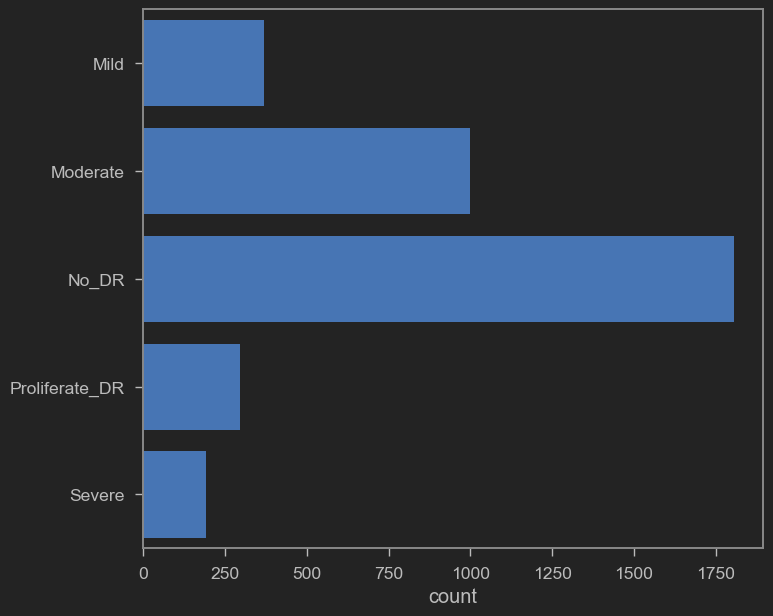

In [35]:
sns.countplot(label)

# TASK #3: PERFORM DATA EXPLORATION AND DATA VISUALIZATION

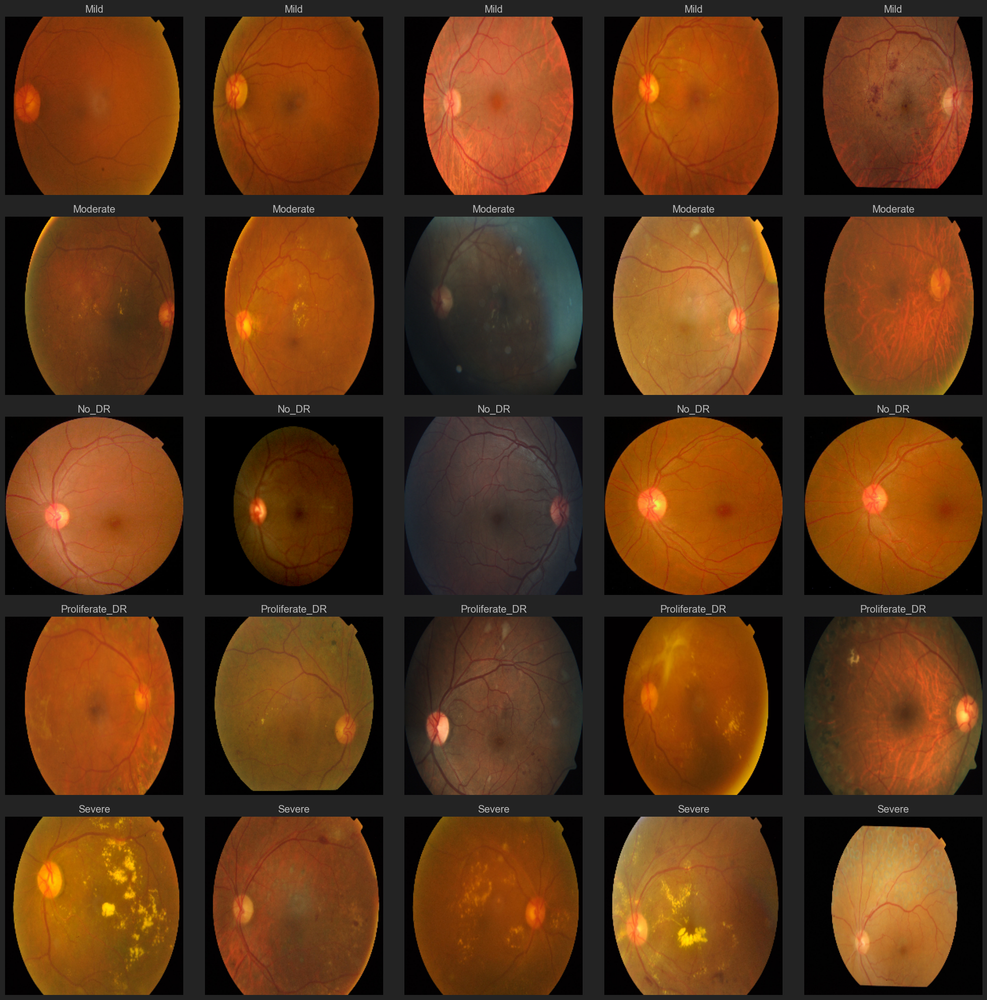

In [36]:


# Define the correct dataset path
dataset_path = r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train'

# Create a subplot of 5x5 (5 images per class for 5 classes)
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
count = 0

# Iterate over each class (Mild, Moderate, Severe, etc.)
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    
    # Skip if it's not a directory (e.g., train.csv file)
    if os.path.isdir(class_path):
        # Get the list of images in the class directory
        train_class = os.listdir(class_path)
        
        # Ensure there are at least 5 images in the class folder
        if len(train_class) < 5:
            print(f"Not enough images in class {class_name}. Skipping this class.")
            continue
        
        # Plot up to 5 images for the current class
        for j in range(5):
            try:
                img_path = os.path.join(class_path, train_class[j])
                img = PIL.Image.open(img_path)
                axs[count][j].title.set_text(class_name)  # Set title as class name
                axs[count][j].imshow(img)  # Display the image
                axs[count][j].axis('off')  # Turn off axis for cleaner display
            except Exception as e:
                print(f"Error loading image {train_class[j]} in class {class_name}: {e}")
        
        count += 1  # Move to the next row for the next class

fig.tight_layout()
plt.show()


In [37]:
# Check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

# Iterate through the contents of the dataset folder
for i in os.listdir(r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train'):
    # Construct the full path and check if it's a directory
    class_path = os.path.join(r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train', i)
    if os.path.isdir(class_path):  # Skip if it's a file (like train.csv)
        train_class = os.listdir(class_path)
        No_images_per_class.append(len(train_class))
        Class_name.append(i)
        print('Number of images in {} = {} \n'.format(i, len(train_class)))


Number of images in Mild = 370 

Number of images in Moderate = 999 

Number of images in No_DR = 1805 

Number of images in Proliferate_DR = 295 

Number of images in Severe = 193 



In [38]:
retina_df = pd.DataFrame({'Image': train,'Labels': label})
retina_df

,Image,Labels
0,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Mild
1,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Mild
2,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Mild
3,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Mild
4,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Mild
...,...,...
3657,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Severe
3658,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Severe
3659,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Severe
3660,C:\Users\Tej Bachhav\OneDrive\Documents\GitHub...,Severe


MINI CHALLENGE #2: 
- Plot a pie chart showing the percentage of samples per class. 

# TASK #4: PERFORM DATA AUGMENTATION AND CREATE DATA GENERATOR

In [39]:
# Shuffle the data and split it into training and testing
retina_df = shuffle(retina_df)
train, test = train_test_split(retina_df, test_size = 0.2)

In [40]:
# Create run-time augmentation on training and test dataset
# For training datagenerator, we add normalization, shear angle, zooming range and horizontal flip
train_datagen = ImageDataGenerator(
        rescale = 1./255,
        shear_range = 0.2,
        validation_split = 0.15)

# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale = 1./255)

In [41]:
datagen = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    fill_mode="nearest"
)


In [42]:
# Creating datagenerator for training, validation and test dataset.

train_generator = train_datagen.flow_from_dataframe(
    train,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32,
    subset='training')

validation_generator = train_datagen.flow_from_dataframe(
    train,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32,
    subset='validation')

test_generator = test_datagen.flow_from_dataframe(
    test,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32)

Found 2490 validated image filenames belonging to 5 classes.
Found 439 validated image filenames belonging to 5 classes.
Found 733 validated image filenames belonging to 5 classes.


MINI CHALLENGE #3:

- Experiment with other image augmentation strategies to the training data. Pick at least 1 augmentation strategy. 

HINT: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator




# TASK #5: UNDERSTAND THE THEORY AND INTUITION BEHIND CONVOLUTIONAL NEURAL NETWORKS (CNN) AND RESIDUAL BLOCKS

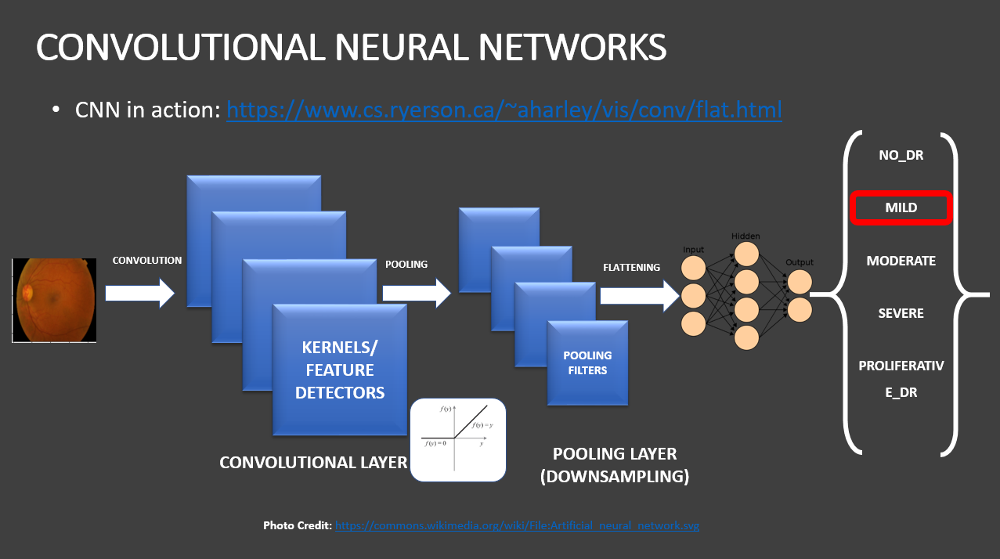

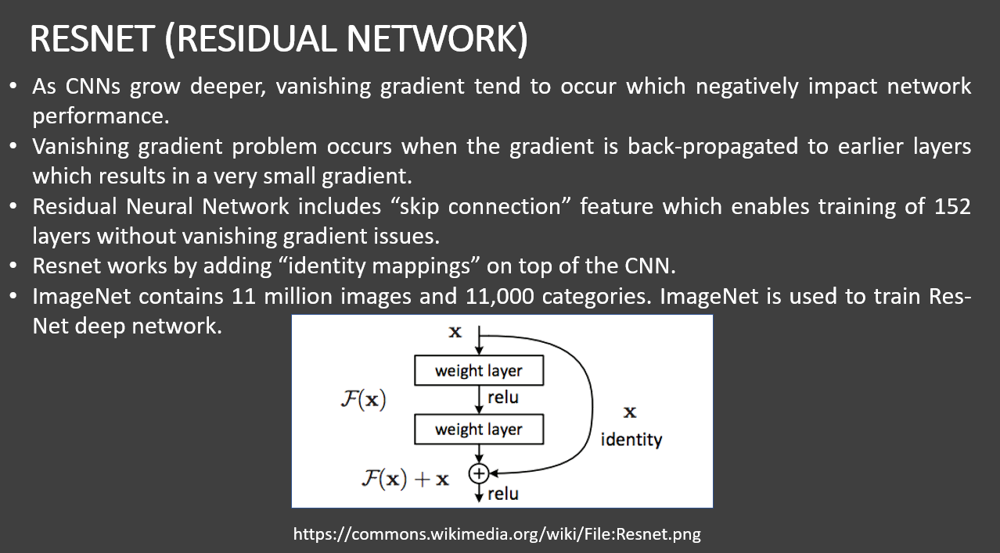

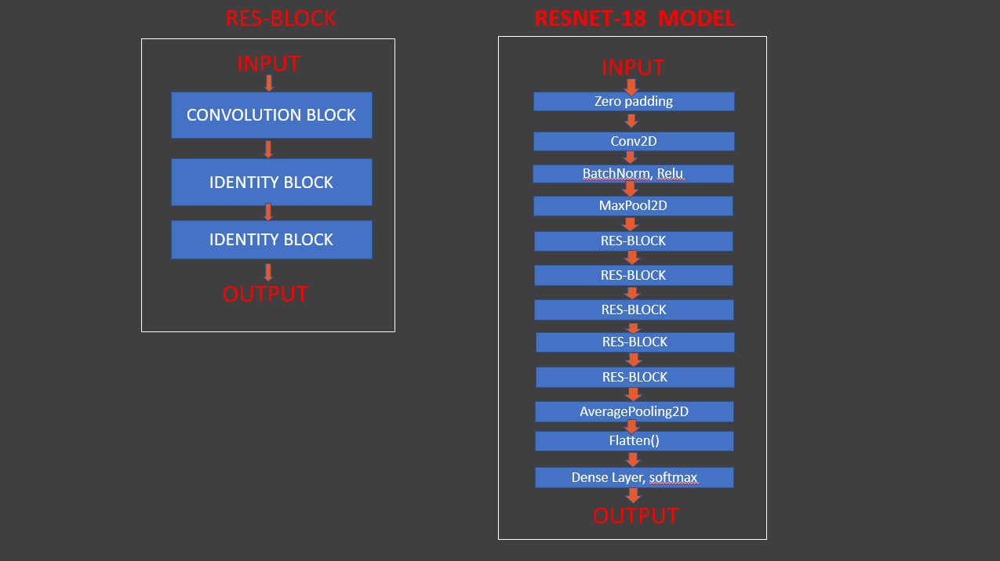

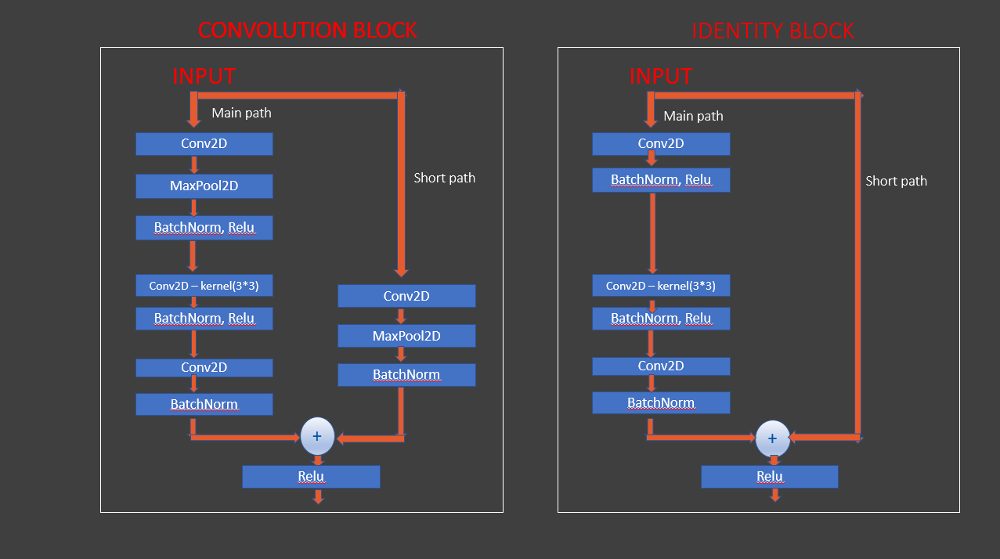

# TASK #6: BUILD RES-BLOCK BASED DEEP LEARNING MODEL

In [43]:
def res_block(X, filter, stage):
  
  # Convolutional_block
  X_copy = X

  f1 , f2, f3 = filter
    
  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_conv_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = MaxPool2D((2,2))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_conv_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_c')(X)


  # Short path
  X_copy = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_copy', kernel_initializer= glorot_uniform(seed = 0))(X_copy)
  X_copy = MaxPool2D((2,2))(X_copy)
  X_copy = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_copy')(X_copy)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  # Identity Block 1
  X_copy = X


  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_1_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_1_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_1_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_c')(X)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  # Identity Block 2
  X_copy = X


  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_2_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_2_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_2_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_c')(X)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [44]:

input_shape = (256,256,3)

#Input tensor shape
X_input = Input(input_shape)

#Zero-padding

X = ZeroPadding2D((3,3))(X_input)

# 1 - stage

X = Conv2D(64, (7,7), strides= (2,2), name = 'conv1', kernel_initializer= glorot_uniform(seed = 0))(X)
X = BatchNormalization(axis =3, name = 'bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3,3), strides= (2,2))(X)

# 2- stage

X = res_block(X, filter= [64,64,256], stage= 2)

# 3- stage

X = res_block(X, filter= [128,128,512], stage= 3)

# 4- stage

X = res_block(X, filter= [256,256,1024], stage= 4)

# # 5- stage

# X = res_block(X, filter= [512,512,2048], stage= 5)

#Average Pooling

X = AveragePooling2D((2,2), name = 'Averagea_Pooling')(X)

#Final layer

X = Flatten()(X)
X = Dense(5, activation = 'softmax', name = 'Dense_final', kernel_initializer= glorot_uniform(seed=0))(X)


model = Model( inputs= X_input, outputs = X, name = 'Resnet18')

model.summary()

Model: "Resnet18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1 (Conv2D)      │ (None, 128, 128,  │      9,472 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_conv1            │ (None, 128, 128,  │        256 │ conv1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ bn_conv1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 63, 63,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_a        │ (None, 63, 63,    │      4,160 │ max_pooling2d[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 31, 31,    │          0 │ res_2_conv_a[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2_conv_a         │ (None, 31, 31,    │        256 │ max_pooling2d_1[… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 31, 31,    │          0 │ bn_2_conv_a[0][0] │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_b        │ (None, 31, 31,    │     36,928 │ activation_1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2_conv_b         │ (None, 31, 31,    │        256 │ res_2_conv_b[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 31, 31,    │          0 │ bn_2_conv_b[0][0] │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_copy     │ (None, 63, 63,    │     16,640 │ max_pooling2d[0]… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ res_2_conv_c        │ (None, 31, 31,    │     16,640 │ activation_2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 31, 31,    │          0 │ res_2_conv_copy[… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_2_conv_c         │ (None, 31, 31,    │      1,024 │ res_2_conv_c[0][

 Total params: 4,987,525 (19.03 MB)

 Trainable params: 4,967,685 (18.95 MB)

 Non-trainable params: 19,840 (77.50 KB)

# TASK #7: COMPILE AND TRAIN DEEP LEARNING MODEL

In [45]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics= ['accuracy'])


In [62]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten

import os

# Define paths
train_dir = r'C:\Users\Tej Bachhav\OneDrive\Documents\GitHub\Deep-Learning-on-Retinopathy-Diabetes-Dataset\Retinopathy-Diabetes Dataset\Notebooks\train'

# Create an ImageDataGenerator for data augmentation and validation split
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # 20% validation split
# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale = 1./255)

# Load training images from the folder, automatically splitting into training and validation sets
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),  # Resize images
    batch_size=32,
    class_mode='categorical',  # For multi-class classification
    subset='training'  # Training data subset
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    subset='validation'  # Validation data subset
)

test_generator = test_datagen.flow_from_dataframe(
    test,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(150, 150),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32
)

# Define your model (CNN for image classification)
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(train_generator.num_classes, activation='softmax')  # Output layer
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
checkpointer = ModelCheckpoint(filepath="best_weights.keras", verbose=1, save_best_only=True)

# Train the model using the generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=[earlystopping, checkpointer]
)


Found 2931 images belonging to 5 classes.
Found 731 images belonging to 5 classes.
Found 733 validated image filenames belonging to 5 classes.


c:\Users\Tej Bachhav\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50


c:\Users\Tej Bachhav\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.6251 - loss: 1.4942
Epoch 1: val_loss improved from inf to 0.74660, saving model to best_weights.keras
92/92 ━━━━━━━━━━━━━━━━━━━━ 18s 173ms/step - accuracy: 0.6256 - loss: 1.4891 - val_accuracy: 0.7209 - val_loss: 0.7466
Epoch 2/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.7007 - loss: 0.7854
Epoch 2: val_loss improved from 0.74660 to 0.74024, saving model to best_weights.keras
92/92 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - accuracy: 0.7008 - loss: 0.7852 - val_accuracy: 0.7456 - val_loss: 0.7402
Epoch 3/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.7132 - loss: 0.7526
Epoch 3: val_loss improved from 0.74024 to 0.73319, saving model to best_weights.keras
92/92 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - accuracy: 0.7133 - loss: 0.7524 - val_accuracy: 0.7155 - val_loss: 0.7332
Epoch 4/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.7418 - loss: 0.7123
Epoch 4: val_loss improved from 0.73319 to 0.72959, savi

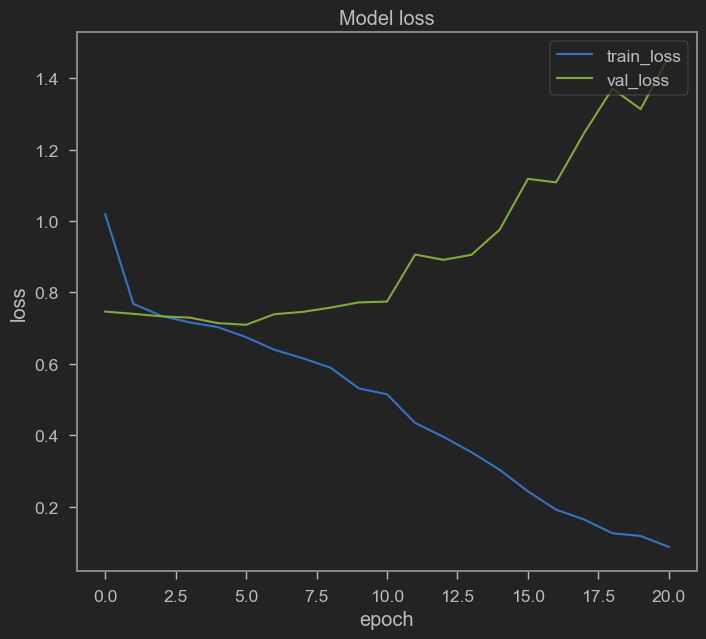

In [63]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss','val_loss'], loc = 'upper right')
plt.show()


In [64]:
# Evaluate the performance of the model on the test dataset
evaluate = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size, verbose=1)
# Get the number of images per class in the test dataset
test_class_counts = test['Labels'].value_counts()

# Print the number of images per class in the test dataset
print("Number of images per class in the test dataset:")
print(test_class_counts)

# Print the accuracy of the model on the test dataset
print('Test Accuracy: {:.2f}%'.format(evaluate[1] * 100))

22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - accuracy: 0.9438 - loss: 0.2466
Number of images per class in the test dataset:
Labels
No_DR             391
Moderate          181
Mild               72
Proliferate_DR     55
Severe             34
Name: count, dtype: int64
Test Accuracy: 93.04%


In [65]:
# Assigning label names to the corresponding indexes
labels = {0: 'Mild', 1: 'Moderate', 2: 'No_DR', 3:'Proliferate_DR', 4: 'Severe'}

In [69]:
# Loading images and their predictions 

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
# import cv2

prediction = []
original = []
image = []
count = 0

for item in range(len(test)):
  # code to open the image
  img= PIL.Image.open(test['Image'].tolist()[item])
  # resizing the image to (150,150)
  img = img.resize((150,150))
  # appending image to the image list
  image.append(img)
  # converting image to array
  img = np.asarray(img, dtype= np.float32)
  # normalizing the image
  img = img / 255
  # reshaping the image to the expected input shape of the model
  img = img.reshape(-1, 150, 150, 3)
  # making prediction of the model
  predict = model.predict(img)
  # getting the index corresponding to the highest value in the prediction
  predict = np.argmax(predict)
  # appending the predicted class to the list
  prediction.append(labels[predict])
  # appending original class to the list
  original.append(test['Labels'].tolist()[item])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━

In [70]:
# Getting the test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.9263301500682128


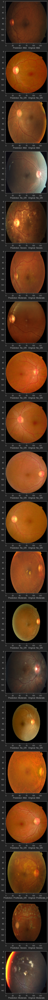

In [73]:
# Visualizing the results
import random
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [74]:
from sklearn.metrics import classification_report

# Generate the classification report
report = classification_report(original, prediction, target_names=Class_name)
print(report)

                precision    recall  f1-score   support

          Mild       0.98      0.61      0.75        72
      Moderate       0.87      0.94      0.90       181
         No_DR       0.96      0.99      0.98       391
Proliferate_DR       0.84      0.89      0.87        55
        Severe       0.88      0.82      0.85        34

      accuracy                           0.93       733
     macro avg       0.91      0.85      0.87       733
  weighted avg       0.93      0.93      0.92       733



jupyter nbconvert --to pdf your_file.ipynb